In [1]:
import os

In [2]:
box_path  = '../../Library/CloudStorage/Box-Box/'
data_path = 'Research/'
os.path.exists(box_path+data_path)

True

In [5]:
country_dirs = [d for d in next(os.walk(box_path+data_path))[1] if (d != 'Descriptive Statistics') and (d != '--Nothing to Analyze -- Random Stuff') and (d != 'New folder')]
country_dirs

['Benin',
 'Tunisia',
 'Luxembourg',
 'Democratic Republic of Congo',
 'Gabon',
 'Haiti',
 'France',
 'Belgium',
 'Morocco',
 'Seychelles',
 'Mali',
 'Central African Republic',
 'Burkina Fasso',
 'Congo, Republic of',
 'Algeria',
 'Switzerland',
 'Senegal',
 'Togo',
 'Comoros',
 'Chad',
 'Niger',
 'Guinea',
 'Monaco',
 'Cameroon',
 'Vanuatu',
 'Equatorial Guinea',
 'Madagascar',
 "Cote d'Ivoire",
 'Vietnam',
 'Rwanda',
 'Djibouti',
 'Burundi',
 'Canada']

In [6]:
next(os.walk(box_path+data_path+country_dirs[0]))

('../../Library/CloudStorage/Box-Box/Research/Benin', [], ['Benin_Law.docx'])

In [7]:
doc_path = os.listdir(box_path+data_path+country_dirs[0])[0]

In [8]:
from docx import Document

doc = Document(box_path+data_path+country_dirs[0]+'/'+doc_path)

In [9]:
box_path+data_path+country_dirs[0]+'/'+doc_path

'../../Library/CloudStorage/Box-Box/Research/Benin/Benin_Law.docx'

In [10]:
doc.paragraphs[2].text

'à caractère personnel en'

In [ ]:
' '.join([p.text for p in doc.paragraphs])

In [12]:
import glob
glob.glob(box_path+data_path+country_dirs[0]+'/'+doc_path)

['../../Library/CloudStorage/Box-Box/Research/Benin/Benin_Law.docx']

In [13]:
import pypdf
def extract_text(country_dir):
    all_paths = [f for f in os.listdir(box_path+data_path+country_dir)]
    if (len(all_paths) == 0) or (all_paths[0].endswith('.boxnote')):
        print(f'No files found for {country_dir}')
        return (country_dir, '')
    docx_path = [f for f in all_paths if (f.endswith('.docx')) and (('Law' in f) or ('law' in f))]
    if len(docx_path) > 0:
        full_doc_path = box_path+data_path+country_dir+'/'+docx_path[0]
        doc = Document(full_doc_path)
        return (country_dir, ' '.join([p.text for p in doc.paragraphs]))
    else:
        pdf_path = [f for f in all_paths if f.endswith('.pdf') and (('Law' in f) or ('law' in f))]
        full_pdf_path = box_path+data_path+country_dir+'/'+pdf_path[0]
        read_pdf = pypdf.PdfReader(full_pdf_path)
        return (country_dir, ' '.join([p.extract_text() for p in read_pdf.pages]))

In [14]:
country_text = [extract_text(d) for d in country_dirs]

No files found for Haiti
No files found for Central African Republic
No files found for Comoros
No files found for Guinea
No files found for Vanuatu
No files found for Equatorial Guinea
No files found for Djibouti
No files found for Burundi


In [15]:
country_text = sorted(country_text, key=lambda x: x[0])

In [16]:
import pandas as pd
df = pd.DataFrame(country_text).rename(columns={0:'country', 1:'law'})

In [17]:
df.country.iloc[3] = 'Burkina Faso'

In [18]:
df

,country,law
0,Algeria,Loi n° 18-07 du 25 Ramadhan 1439 correspondant...
1,Belgium,"SERVICE PUBLIC FEDERAL JUSTICE, SERVICE PUBLIC..."
2,Benin,Loi n° 2009-09 portant protection des données ...
3,Burkina Faso,[NB ‐ Loi n°001‐2021/AN du 30 mars 2021 portan...
4,Burundi,
5,Cameroon,Cameroon Décret Nº 2013/0399/PM : fixant les...
6,Canada,Titre abrégé Note marginale :Titre abrégé 1 Lo...
7,Central African Republic,
8,Chad,REPUBLIQUE DU TCHAD\t ------------- PRESIDENCE...
9,Comoros,


In [17]:
# df.to_csv('./data/all_countries_with_law_text.csv')

In [19]:
desc_path = "../../Library/CloudStorage/Box-Box/Research/Descriptive Statistics/MASTER_DO_NOT_TOUCH_AllPlatformsDescriptives.xlsx"
os.path.exists(desc_path)

True

In [20]:
import pandas as pd

desc = pd.read_excel(desc_path)
desc.Country.iloc[1] = 'Belgium'
desc

/var/folders/l_/b5wczsf55z9dmf_dzr3vw6ph0000gr/T/ipykernel_13262/2408104459.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  desc.Country.iloc[1] = 'Belgium'


,Country,Meta Offices,Meta Employees,Twitter Offices,Twitter Employees,TikTok Offices,TikTok Employees,Country Population,Meta Users(by million),Twitter Users(by million),TikTok Users(by million),Meta Tier Ranking,Internet Penetration,Digital Privacy Law
0,Algeria,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Belgium,1.0,200.0,1.0,200.0,1.0,20.0,11.5 million,12.30,4.500,1.6 million,1.0,0.986,NaN
2,Benin,0.0,0.0,0.0,0.0,0.0,0.0,12.8 million,2.30,0.100,100000,3.0,0.389,Law No. 2018-004
3,Burkina Faso,0.0,0.0,0.0,0.0,0.0,0.0,21.5 million,1.20,0.050,200000,3.0,0.225,NaN
4,Burundi,0.0,0.0,0.0,0.0,0.0,0.0,12.8 million,1.00,0.020,100000,3.0,0.174,NaN
5,Cameroon,0.0,0.0,1.0,50.0,0.0,0.0,27.6 million,10.50,0.800,3 million,2.0,0.524,Law No. 2016/016
6,Canada,2.0,400.0,2.0,500.0,1.0,100.0,38.0 million,36.10,20.500,10 million,1.0,0.984,Personal Information Protection and Electronic...
7,Central African Republic,0.0,0.0,0.0,0.0,0.0,0.0,4.7 million,0.50,0.010,50000,4.0,0.104,NaN
8,Chad,0.0,0.0,0.0,0.0,0.0,0.0,16.4 million,0.30,0.010,100000,4.0,0.217,NaN
9,Comoros,0.0,0.0,0.0,0.0,0.0,0.0,841000,0.20,0.001,50000,4.0,0.229,NaN


In [49]:
desc_merge = desc.merge(df, left_on="Country", right_on="country", how='inner').drop("country", axis=1)

In [50]:
def convert_population(population):
    if type(population) == str:
        parts = population.split()
        value, unit = float(parts[0]), parts[1]
        if unit == "million":
            return value * 1e6
    return float(population)

def convert_tiktok_users(users):
    if type(users) == str:
        parts = users.split()
        value, unit = float(parts[0]), parts[1]
        if unit == "million":
            return value
    else:
        return users/1e6

In [51]:
desc_merge['Country Population'] = desc_merge['Country Population'].apply(convert_population) 
desc_merge['TikTok Users(by million)'] = desc_merge['TikTok Users(by million)'].apply(convert_population) 

In [52]:
desc_merge

,Country,Meta Offices,Meta Employees,Twitter Offices,Twitter Employees,TikTok Offices,TikTok Employees,Country Population,Meta Users(by million),Twitter Users(by million),TikTok Users(by million),Meta Tier Ranking,Internet Penetration,Digital Privacy Law,law
0,Algeria,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Loi n° 18-07 du 25 Ramadhan 1439 correspondant...
1,Belgium,1.0,200.0,1.0,200.0,1.0,20.0,11500000.0,12.30,4.500,1600000.0,1.0,0.986,NaN,"SERVICE PUBLIC FEDERAL JUSTICE, SERVICE PUBLIC..."
2,Benin,0.0,0.0,0.0,0.0,0.0,0.0,12800000.0,2.30,0.100,100000.0,3.0,0.389,Law No. 2018-004,Loi n° 2009-09 portant protection des données ...
3,Burkina Faso,0.0,0.0,0.0,0.0,0.0,0.0,21500000.0,1.20,0.050,200000.0,3.0,0.225,NaN,[NB ‐ Loi n°001‐2021/AN du 30 mars 2021 portan...
4,Burundi,0.0,0.0,0.0,0.0,0.0,0.0,12800000.0,1.00,0.020,100000.0,3.0,0.174,NaN,
5,Cameroon,0.0,0.0,1.0,50.0,0.0,0.0,27600000.0,10.50,0.800,3000000.0,2.0,0.524,Law No. 2016/016,Cameroon Décret Nº 2013/0399/PM : fixant les...
6,Canada,2.0,400.0,2.0,500.0,1.0,100.0,38000000.0,36.10,20.500,10000000.0,1.0,0.984,Personal Information Protection and Electronic...,Titre abrégé Note marginale :Titre abrégé 1 Lo...
7,Central African Republic,0.0,0.0,0.0,0.0,0.0,0.0,4700000.0,0.50,0.010,50000.0,4.0,0.104,NaN,
8,Chad,0.0,0.0,0.0,0.0,0.0,0.0,16400000.0,0.30,0.010,100000.0,4.0,0.217,NaN,REPUBLIQUE DU TCHAD\t ------------- PRESIDENCE...
9,Comoros,0.0,0.0,0.0,0.0,0.0,0.0,841000.0,0.20,0.001,50000.0,4.0,0.229,NaN,


In [53]:
set(df.country) ^ set(desc_merge.Country)

set()

In [54]:
desc_merge.to_csv("./data/all_countries_desc_stats_full_laws.csv")

## Geoprocessing

In [102]:
import geopandas as gpd

polys = gpd.read_file("./geodata/countries.geojson")

In [103]:
map_df = polys.loc[polys.ADMIN.isin(desc_merge.Country)].reset_index(drop=True)

In [133]:
polys.loc[polys.ADMIN.str.contains('Congo')]

,ADMIN,ISO_A3,ISO_A2,geometry
47,Democratic Republic of the Congo,COD,CD,"MULTIPOLYGON (((12.99459 -5.86824, 12.96930 -5..."
48,Republic of Congo,COG,CG,"MULTIPOLYGON (((17.62728 3.62632, 17.70913 3.6..."


In [134]:
polys.loc[polys.ADMIN.str.contains('Ivory')]

,ADMIN,ISO_A3,ISO_A2,geometry
43,Ivory Coast,CIV,CI,"MULTIPOLYGON (((-3.18497 5.13227, -3.16340 5.1..."


In [135]:
name_changes = ['CIV', 'COD', 'COG']
new_name = ["Cote d'Ivoire", 'Democratic Republic of Congo', 'Congo, Republic of']

for i, nc in enumerate(name_changes):
    print(polys.loc[polys.ISO_A3 == nc].ADMIN)
    polys.loc[polys.ISO_A3 == nc].ADMIN = new_name[i]

43    Ivory Coast
Name: ADMIN, dtype: object
47    Democratic Republic of the Congo
Name: ADMIN, dtype: object
48    Republic of Congo
Name: ADMIN, dtype: object


/Users/pnadel01/miniconda3/envs/french_social_media/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/pnadel01/miniconda3/envs/french_social_media/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/pnadel01/miniconda3/envs/french_social_media/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a

In [139]:
polys.iloc[43].ADMIN = "Cote d'Ivoire"

/var/folders/l_/b5wczsf55z9dmf_dzr3vw6ph0000gr/T/ipykernel_10175/1153758554.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [140]:
polys.iloc[43].ADMIN

'Ivory Coast'

In [110]:
import pyproj
map_df.to_crs(epsg=4326, inplace=True)

In [111]:
import plotly.graph_objs as go
import json

path = './geodata/proj_countries.json'

map_df.to_file(path, driver = "GeoJSON")
with open(path) as geofile:
   j_file = json.load(geofile)

In [112]:
j_file['features'][0]

{'type': 'Feature',
 'properties': {'ADMIN': 'Burundi', 'ISO_A3': 'BDI', 'ISO_A2': 'BI'},
 'geometry': {'type': 'MultiPolygon',
  'coordinates': [[[[30.41507328300014, -2.313087665999888],
     [30.418483927000068, -2.311847431999865],
     [30.42323815900005, -2.317325133999944],
     [30.428405802000043, -2.331381123999961],
     [30.434141886000134, -2.339235940999899],
     [30.488453817000163, -2.383781025999895],
     [30.521733440000048, -2.399387308999849],
     [30.554599650000057, -2.400627542999885],
     [30.521475057000146, -2.442278747999893],
     [30.50809086100014, -2.463466083999947],
     [30.470160360000136, -2.555760192999927],
     [30.461995483000067, -2.587489521999942],
     [30.457654663000085, -2.598031514999917],
     [30.448042846000078, -2.610537210999908],
     [30.424168335000104, -2.63317148799996],
     [30.41600345900008, -2.645573831999926],
     [30.41212772600005, -2.670171813999914],
     [30.42323815900005, -2.680920511999929],
     [30.442668498

In [113]:
map_data = desc_merge[["Country", "Country Population"]]

In [114]:
# mapboxt = "pk.eyJ1IjoicG5hZGVsMDEiLCJhIjoiY2xvaGg4N3htMGI4YTJpbzJoNWdsN2RmZSJ9.Xa2ApIo0Szc4XXP4oJMNXw"
import plotly.express as px

# choro = go.Choroplethmapbox(z=map_df['ISO_A3'], locations =  
#         map_df.ADMIN, colorscale = 'Viridis', geojson = j_file, 
#         text = map_df['ADMIN'], marker_line_width=0.1) 

fig = px.choropleth_mapbox(map_df, geojson=map_df['geometry'], locations=map_df['ADMIN'])


In [116]:
map_df.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [119]:
map_df.set_index('ADMIN', inplace=True)

In [143]:
set(map_data.Country) ^ set(map_df.index) 

{'Congo, Republic of', "Cote d'Ivoire", 'Democratic Republic of Congo'}

In [144]:
map_data.iloc[[10, 11, 12]].Country = ["Republic of Congo", "Ivory Coast", "Democratic Republic of the Congo"]

/var/folders/l_/b5wczsf55z9dmf_dzr3vw6ph0000gr/T/ipykernel_10175/3226548321.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [147]:
map_data.iloc[10].Country = "Republic of Congo"

/var/folders/l_/b5wczsf55z9dmf_dzr3vw6ph0000gr/T/ipykernel_10175/225681413.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [126]:
fig = px.choropleth_mapbox(map_df, geojson=map_df['geometry'], locations=map_df.index,mapbox_style="open-street-map",
                           center={'lat':30, 'lon':0},
                           zoom=1,
                           opacity=1,)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## NLP cont

In [3]:
import pandas as pd
df = pd.read_csv('./data/all_countries_desc_stats_full_laws.csv').dropna().reset_index()

In [4]:
df

,index,Unnamed: 0,Country,Meta Offices,Meta Employees,Twitter Offices,Twitter Employees,TikTok Offices,TikTok Employees,Country Population,Meta Users(by million),Twitter Users(by million),TikTok Users(by million),Meta Tier Ranking,Internet Penetration,Digital Privacy Law,law
0,2,2,Benin,0.0,0.0,0.0,0.0,0.0,0.0,12800000.0,2.3,0.100,100000.0,3.0,0.389,Law No. 2018-004,Loi n° 2009-09 portant protection des données ...
1,5,5,Cameroon,0.0,0.0,1.0,50.0,0.0,0.0,27600000.0,10.5,0.800,3000000.0,2.0,0.524,Law No. 2016/016,Cameroon Décret Nº 2013/0399/PM : fixant les...
2,6,6,Canada,2.0,400.0,2.0,500.0,1.0,100.0,38000000.0,36.1,20.500,10000000.0,1.0,0.984,Personal Information Protection and Electronic...,Titre abrégé Note marginale :Titre abrégé 1 Lo...
3,11,11,Cote d'Ivoire,0.0,0.0,1.0,100.0,0.0,0.0,29300000.0,15.8,2.500,5000000.0,2.0,0.639,Law No. 2017-949,PARTIE OFFICIELLE ACTES PRESIDENTIELS \nPRESID...
4,12,12,Democratic Republic of Congo,0.0,0.0,0.0,0.0,0.0,0.0,93300000.0,41.2,1.500,10000000.0,3.0,0.448,Law No. 010/003,EXPOSE DES MOTIFS Les télécommunications et le...
5,15,15,France,2.0,1000.0,3.0,2000.0,2.0,150.0,67200000.0,41.8,27.400,15000000.0,1.0,0.995,French Data Protection Act (DPA),Loi n° 78-17 du 6 janvier 1978 relative à l'in...
6,16,16,Gabon,0.0,0.0,1.0,100.0,1.0,10.0,2200000.0,1.2,0.100,100000.0,2.0,0.662,Law No. 001/2018,Loi n°001/2011 relative à la protection des do...
7,20,20,Madagascar,0.0,0.0,0.0,0.0,1.0,10.0,27800000.0,5.5,0.200,1000000.0,3.0,0.379,Law No. 2018-006,1 PRESIDENCE DE LA REPUBLIQUE ------------...
8,21,21,Mali,0.0,0.0,0.0,0.0,1.0,5.0,20900000.0,12.8,0.050,1000000.0,3.0,0.243,Law No. 08-009,Chapitre 1er : de l’objet Article 1er : Par la...
9,24,24,Niger,0.0,0.0,0.0,0.0,0.0,0.0,22200000.0,10.1,0.010,100000.0,4.0,0.201,Law No. 2018-010,"Loi nº 2017-28 du 03 mai 2017, relative à la p..."


In [11]:
from nltk import sent_tokenize

law_sent = df['law'].apply(sent_tokenize)
law_sent

0     [Loi n° 2009-09 portant protection des données...
1     [Cameroon   Décret Nº 2013/0399/PM : fixant le...
2     [Titre abrégé Note marginale :Titre abrégé 1 L...
3     [PARTIE OFFICIELLE ACTES PRESIDENTIELS \nPRESI...
4     [EXPOSE DES MOTIFS Les télécommunications et l...
5     [Loi n° 78-17 du 6 janvier 1978 relative à l'i...
6     [Loi n°001/2011 relative à la protection des d...
7     [    1 PRESIDENCE DE LA REPUBLIQUE -----------...
8     [Chapitre 1er : de l’objet Article 1er : Par l...
9     [Loi nº 2017-28 du 03 mai 2017, relative à la ...
10    [LOI Nº 058/2021 DU 13/10/2021 RELATIVE À LA P...
11    [LOI n° 2008-12 du 25 janvier 2008 portant sur...
12    [Seychelles Loi sur la protection des données,...
13    [235.1 (État le 1er septembre 2023) Loi fédéra...
14    [ LOI N° 2019-014 DU 29 OCTOBRE 2019 RELATIVE ...
15    [Loi organique n° 2004-63 du 27 juillet 2004, ...
Name: law, dtype: object

In [12]:
len(law_sent.iloc[0])

573

In [13]:
law_split = law_sent.explode().dropna()
law_split

0     Loi n° 2009-09 portant protection des données ...
0     L’Assemblée Nationale a délibéré et adopté, en...
0     Article 2 : L’informatique étant une science a...
0     Article 3 : Tout mécanisme d’identification de...
0     SECTION II DES DEFINITIONS Article 4 : Au sens...
                            ...                        
15    L’instance peut, avant la prise de sa décision...
15    En cas d’urgence et si la poursuite du traitem...
15    Au cours de ce délai, une décision définitive ...
15                                                 Art.
15    14 - L’intéressé est convoqué par l’instance p...
Name: law, Length: 6659, dtype: object

In [29]:
kwdoc = [f for f in os.walk(box_path+data_path)][0][-1][0]
box_path+data_path+kwdoc

'../../Library/CloudStorage/Box-Box/Research/Word Analysis -- For Peter.docx'

In [30]:
from docx import Document

doc = Document(box_path+data_path+kwdoc)
kws =  [d.text.strip().lower() for d in doc.paragraphs if d.text.strip()]
kws

['personnelle',
 'securité',
 'dignité',
 'individuelle',
 'sauvegarde',
 'sûreté',
 'liberté',
 'droits fondamentaux',
 'protection',
 "droit à l'information",
 "droit d'être informé",
 'plainte',
 'administrative',
 'indenmité',
 'entreprise',
 'établissement',
 'institution',
 'exception',
 'sécurité',
 'santé',
 'pornographie',
 'sexuelle',
 'raciste',
 'racisme',
 'scientifique',
 'sauvegarde',
 'publique',
 'obligation',
 'surveillance',
 'gouvernement',
 'organisation',
 'entité']

In [ ]:
# import collections
# kws_dict = collections.defaultdict(list)
# for d in doc.paragraphs:
#     if d.style.style_id == 'Normal':
#         for d in doc.paragraphs:
            
#         kws_dict[d.text] = []
        


In [85]:
kws_dict = {
    "Personelle":[
        "Securité",
        "Dignité",
        "Individuelle",
        "Sauvegarde",
        "Sûreté",
        "Liberté",
        "droits fondamentaux",
        "protection",
        "Droit à l'information", 
        "Droit d'être informé",
        "plainte"
    ],
    "Administrative":[
        "Indenmité",
        "Entreprise",
        "Établissement",
        "Institution",
        {
            "Exception":[
                "Sécurité", 
                "Santé", 
                "Pornographie", 
                "Sexuelle", 
                "Raciste", 
                "Racisme", 
                "scientifique"
            ]
        },
        "Sauvegarde",
        "publique",
        "obligation",
        "surveillance", 
        "gouvernement",
        "organisation",
        "entité"
    ]
}

In [86]:
import json

with open('kws_dict.json', 'w') as f:
    json.dump(kws_dict, f)

# Camembert

https://huggingface.co/dangvantuan/sentence-camembert-large

In [21]:
from sentence_transformers import SentenceTransformer
model =  SentenceTransformer("dangvantuan/sentence-camembert-large")

No sentence-transformers model found with name /Users/pnadel01/.cache/torch/sentence_transformers/dangvantuan_sentence-camembert-large. Creating a new one with MEAN pooling.


In [35]:
law_split.iloc[0]

'Loi n° 18-07 du 25 Ramadhan 1439 correspondant au 10 juin 2018 relative à la protection des personnes physiques dans le traitement des données à caractère personnel.'

In [36]:
first_sentence_vector = model.encode(law_split.iloc[0])

In [37]:
first_sentence_vector.shape

(1024,)

In [91]:
first_sentence_vector

array([-0.26389536,  0.4702357 ,  0.02959218, ..., -0.25349703,
        0.13188739,  0.01468639], dtype=float32)

In [38]:
law_list = list(law_split)
len(law_list)

11742

In [39]:
import torch
import numpy as np
from tqdm import tqdm 
device = torch.device('mps')

vectors = []
for sent in tqdm(law_list):
    v = model.encode(sent, device=device, normalize_embeddings=True)
    vectors.append(v)

embeddings = np.array(vectors)

100%|██████████| 11742/11742 [08:48<00:00, 22.24it/s]


In [40]:
embeddings.shape

(11742, 1024)

In [61]:
kw_vectors = []
for kw in kws:
    v = model.encode(kw, device=device, normalize_embeddings=True)
    kw_vectors.append(v)

kw_embeddings = np.array(kw_vectors)

In [62]:
kw_embeddings.shape

(16, 1024)

In [64]:
score = kw_embeddings @ embeddings.T # pearson kw * embeddings/ |kw| * |embeddings|

In [65]:
score.shape

(16, 11742)

In [94]:
i = 2
print(kws[i])
print('-'*10)
sim_sents = score[i].argsort()[::-1][:5]
for sim_sent_id in sim_sents:
    print(score[i][sim_sent_id])
    print(law_list[sim_sent_id])
    print('\n')

sécurité nationale
----------
0.42510885
Responsabilités du Ministère de la Sécurité Publique 1.


0.40988952
L'OCRC, placé sous la tutelle du Ministère en charge de la sécurité publique, a une compétence nationale.


0.3619504
Les services publics competents de l'État  derogent au secret des correspondances pour des raisons de sécurité interieure et/ou exterieure de l'État , de defense nationals ou d'ordre public.


0.3500942
34. 	sécurité nationale Les données à caractère personnel sont exemptées des dispositions de la partie II et des articles 28 à 31 si l'exemption est nécessaire pour sauvegarder la sécurité nationale.


0.31615162
Le présent règlement ne s'applique pas à des questions de protection des libertés et droits fondamentaux ou de libre flux des données à caractère personnel concernant des activités qui ne relèvent pas du champ d'application du droit de l'Union, telles que les activités relatives à la sécurité nationale.




# xlm roberta xnli

joeddav/xlm-roberta-large-xnli

In [1]:
from transformers import pipeline
import torch

device = torch.device('mps')
classifier = pipeline("zero-shot-classification",
                      model="joeddav/xlm-roberta-large-xnli",
                      device=device)

Some weights of the model checkpoint at joeddav/xlm-roberta-large-xnli were not used when initializing XLMRobertaForSequenceClassification: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [2]:
law_list = list(law_split.dropna())
test_list = law_list[:1000]

all_model_outputs = []
for preprocessed in classifier.preprocess(test_list):
    model_outputs = classifier.forward(preprocessed)
    all_model_outputs.append(model_outputs)
outputs = classifier.postprocess(all_model_outputs)



# zs = classifier(law_list[400], kws, device=device)
# zs

NameError: name 'law_split' is not defined

In [99]:
import re
law_split.apply(lambda x: x if not re.search("\d+\.|Art.", x) else None).dropna()

0     Loi n° 2009-09 portant protection des données ...
0     L’identification se fait à partir des moyens d...
0     Des mesures appropriées doivent être prises po...
0     La collecte ou le traitement des données opéré...
0     Toutefois, les communautés religieuses ou les ...
                            ...                        
15    13 - Si le responsable du traitement ou le sou...
15    L’instance peut, avant la prise de sa décision...
15    En cas d’urgence et si la poursuite du traitem...
15    Au cours de ce délai, une décision définitive ...
15    14 - L’intéressé est convoqué par l’instance p...
Name: law, Length: 4400, dtype: object

In [95]:
import re
test_list = list(law_split.apply(lambda x: x if not re.search('\d+\.', x) else None).dropna())
len(test_list)

5642

In [47]:
import re

parent_kws = ['Personelle', 'Administrative']
test_list = list(law_split.apply(lambda x: x if not re.search('\d+\.|[A-z]{1,5}\.', x) else None).dropna())
zs = classifier(test_list, parent_kws, device=device)

In [49]:
from sklearn.manifold import TSNE
import numpy as np

logit_dicts = [dict(sorted(dict(zip(s['labels'], s['scores'])).items())) for s in zs]
logit_matrix = np.array([np.array(list(d.values())) for d in logit_dicts])

tsne = TSNE()
logit_embedded = tsne.fit_transform(logit_matrix)

In [50]:
xs = logit_embedded[:, 0]
ys = logit_embedded[:, 1]

In [52]:
import pandas as pd

zstm = pd.DataFrame({'x':xs, 'y':ys, 'text':test_list})
zstm['label'] = zstm['text'].apply(lambda x: [d['labels'][0] for d in zs if d['sequence'] == x][0])

In [54]:
import plotly.express as px

fig = px.scatter(zstm['x'], zstm['y'], color=zstm['label'])

In [55]:
fig

In [56]:
test_list[461], test_list[459]

('3° la liste des autorités compétentes visées à l’article 26, 7°.',
 "La requête énonce les éléments de faits et de droit de nature à justifier lesdites opérations et à permettre au Président du Tribunal de première instance d'en apprécier le bien-fondé.")

In [61]:
personelle_text = list(zstm.loc[zstm.label == 'Personelle'].text)

In [84]:
zstm.label.value_counts()

label
Personelle        355
Administrative    145
Name: count, dtype: int64

In [59]:
personelle_kw = [
    'securité',
    'dignité',
    'individuelle',
    'sauvegarde',
    'sûreté',
    'liberté',
    'droits fondamentaux',
    'protection',
    "droit à l'information",
    "droit d'être informé",
    'plainte',
]

In [62]:
personelle_zs = classifier(personelle_text, personelle_kw, device=device)

In [80]:
logit_dicts = [dict(sorted(dict(zip(s['labels'], s['scores'])).items())) for s in personelle_zs]
logit_matrix = np.array([np.array(list(d.values())) for d in logit_dicts])

tsne = TSNE()
logit_embedded = tsne.fit_transform(logit_matrix)

xs = logit_embedded[:, 0]
ys = logit_embedded[:, 1]

p_zstm = pd.DataFrame({'x':xs, 'y':ys, 'text':personelle_text})
p_zstm['label'] = p_zstm['text'].apply(lambda x: [d['labels'][0] for d in personelle_zs if d['sequence'] == x][0])
p_zstm['text'] = p_zstm['text'].str.wrap(150).apply(lambda x: x.replace('\n', '<br>'))

fig = px.scatter(p_zstm['x'], p_zstm['y'], color=p_zstm['label'], hover_name=p_zstm['text'])

In [81]:
fig

In [86]:
p_zstm.label.value_counts()

label
droit d'être informé     143
protection                69
individuelle              34
sauvegarde                33
liberté                   26
plainte                   14
droit à l'information     14
securité                  10
sûreté                     6
dignité                    5
droits fondamentaux        1
Name: count, dtype: int64

In [90]:
zs = classifier(law_list[3301], kws, device=device)
zs

{'sequence': "Article 465 : Commissaire du Gouvernement Un commissaire du Gouvernement, désigné par le Président de la République en Conseil des Ministres, siège auprès de l'Autorité.",
 'labels': ['consentement',
  'droit à l’oubli',
  'procès',
  'investigation',
  'sexuelle',
  'indemnité',
  'pornographique',
  'enquête',
  'xénophobie',
  'médicale',
  'exception',
  'police',
  'sûreté de l’état',
  'santé',
  'sécurité nationale',
  'règlement général sur la protection des données'],
 'scores': [0.14989471435546875,
  0.1385583132505417,
  0.13295938074588776,
  0.10448801517486572,
  0.06569395214319229,
  0.06484733521938324,
  0.06335519999265671,
  0.04947521165013313,
  0.046081624925136566,
  0.04423670098185539,
  0.03992103412747383,
  0.035331904888153076,
  0.024825291708111763,
  0.015456132590770721,
  0.014442655257880688,
  0.010432498529553413]}

In [84]:
zs = classifier(law_list, kws, device=device)

KeyboardInterrupt: 

# Data from cluster

In [5]:
import pickle
import glob
import numpy as np

pickled_responses = glob.glob('./data/*.p')

with open(pickled_responses[0], 'rb') as f:
        child_0 = pickle.load(f)

with open(pickled_responses[1], 'rb') as f:
        parent = pickle.load(f)

with open(pickled_responses[2], 'rb') as f:
        child_1 = pickle.load(f)

len(parent), len(child_0), len(child_1)

(4400, 3028, 1372)

In [6]:
parent[0]['labels']

['Personelle', 'Administrative']

In [7]:
def get_logit_dicts(response):
    return [dict(sorted(dict(zip(s['labels'], s['scores'])).items())) for s in response]

In [8]:
get_logit_dicts(child_0)

[{'Dignité': 0.010270756669342518,
  "Droit d'être informé": 0.001439590472728014,
  "Droit à l'information": 0.6408225893974304,
  'Individuelle': 0.019751090556383133,
  'Liberté': 0.007895356975495815,
  'Sauvegarde': 0.019237423315644264,
  'Securité': 0.044935256242752075,
  'Sûreté': 0.010858350433409214,
  'droits fondamentaux': 0.005408105906099081,
  'plainte': 0.010591142810881138,
  'protection': 0.22879037261009216},
 {'Dignité': 0.09570001065731049,
  "Droit d'être informé": 0.06521297246217728,
  "Droit à l'information": 0.07562308758497238,
  'Individuelle': 0.09289442002773285,
  'Liberté': 0.12956859171390533,
  'Sauvegarde': 0.09813345223665237,
  'Securité': 0.0853523463010788,
  'Sûreté': 0.07477458566427231,
  'droits fondamentaux': 0.06508532166481018,
  'plainte': 0.09102782607078552,
  'protection': 0.12662741541862488},
 {'Dignité': 0.025710098445415497,
  "Droit d'être informé": 0.014413460157811642,
  "Droit à l'information": 0.01913236454129219,
  'Individue

In [9]:
child_1

[{'sequence': 'La collecte ou le traitement des données opéré(e) par tout moyen frauduleux, déloyal, illicite est interdit(e).',
  'labels': ['entité',
   'publique',
   'obligation',
   'Sauvegarde',
   'Établissement',
   'Institution',
   'surveillance',
   'Entreprise',
   'Indenmité',
   'organisation',
   'gouvernement',
   'Exception'],
  'scores': [0.23186485469341278,
   0.22855238616466522,
   0.18868021667003632,
   0.15023215115070343,
   0.0712096318602562,
   0.04481721296906471,
   0.02133980765938759,
   0.01661526970565319,
   0.016457386314868927,
   0.01372598297894001,
   0.00857070554047823,
   0.007934355176985264]},
 {'sequence': 'Pour des motifs d’intérêt public, il peut aussi être fait exception à l’interdiction ci-dessus sur proposition ou avis conforme de la Commission nationale de l’informatique et des libertés (CNIL) prévue à l’article 19 de la présente loi.',
  'labels': ['Exception',
   'publique',
   'Institution',
   'gouvernement',
   'entité',
   'Sau

In [14]:
import re
sents = law_split.apply(lambda x: x if not re.search("\d+\.|Art.", x) else None).dropna()
country_idx = sents.loc[sents == child_0[0]['sequence']].index[0]
df.iloc[country_idx]

index                                                                        2
Unnamed: 0                                                                   2
Country                                                                  Benin
Meta Offices                                                               0.0
Meta Employees                                                             0.0
Twitter Offices                                                            0.0
Twitter Employees                                                          0.0
TikTok Offices                                                             0.0
TikTok Employees                                                           0.0
Country Population                                                  12800000.0
Meta Users(by million)                                                     2.3
Twitter Users(by million)                                                  0.1
TikTok Users(by million)                            

In [15]:
sents = law_split.apply(lambda x: x if not re.search("\d+\.|Art.", x) else None).dropna()
def find_country(response):
    country_idx = sents.loc[sents == response['sequence']].index[0]
    response['country'] = df.iloc[country_idx]['Country']
    return response

In [16]:
child_0 = [find_country(c) for c in child_0]

In [17]:
len(child_0)

3028

In [18]:
child_0[2000]

{'sequence': 'Le cas échéant, la HAPD prend toutes les dispositions utiles pour assurer l’indépendance et l’impartialité de ses membres.',
 'labels': ['protection',
  'Sauvegarde',
  'Securité',
  'Sûreté',
  'Liberté',
  'Individuelle',
  'Dignité',
  'droits fondamentaux',
  'plainte',
  "Droit à l'information",
  "Droit d'être informé"],
 'scores': [0.7103217840194702,
  0.09095369279384613,
  0.07203814387321472,
  0.040757916867733,
  0.024345090612769127,
  0.02270055003464222,
  0.013299190439283848,
  0.010862192139029503,
  0.010512742213904858,
  0.0021990197710692883,
  0.002009547781199217],
 'country': 'Niger'}

In [19]:
# Search engine by keyword -> using zs
# Show keyword freq on map
# Correlation between laws
    # compare zs tags
    # regress word embeddings
    # word syntax frequency correlation

In [25]:
sents.to_csv('sents.csv')

In [20]:
sents = pd.read_csv('sents.csv')

In [21]:
sents = sents.rename(columns={'Unnamed: 0':'org_idx'})
sents

,org_idx,law
0,0,Loi n° 2009-09 portant protection des données ...
1,0,L’identification se fait à partir des moyens d...
2,0,Des mesures appropriées doivent être prises po...
3,0,La collecte ou le traitement des données opéré...
4,0,"Toutefois, les communautés religieuses ou les ..."
...,...,...
4395,15,13 - Si le responsable du traitement ou le sou...
4396,15,"L’instance peut, avant la prise de sa décision..."
4397,15,En cas d’urgence et si la poursuite du traitem...
4398,15,"Au cours de ce délai, une décision définitive ..."


In [22]:
sents.loc[sents['law'] == child_0[0]['sequence']]['org_idx'].iloc[0]

0

In [23]:
def find_country(response):
    country_idx = sents.loc[sents['law'] == response['sequence']]['org_idx'].iloc[0]
    response['country'] = df.iloc[country_idx]['Country']
    return response

In [24]:
from collections import defaultdict

counts = defaultdict(int)
child_select = 'Dignité'
for child in child_0:
    child = find_country(child)
    if child['labels'][0] == child_select:
        counts[child['country']] += 1

In [25]:
counts = dict(counts)

In [43]:
counts

{'Benin': 1,
 'Cameroon': 1,
 'Canada': 27,
 'Democratic Republic of Congo': 7,
 'France': 5,
 'Gabon': 1,
 'Madagascar': 2,
 'Mali': 1,
 'Niger': 2,
 'Senegal': 2,
 'Seychelles': 1,
 'Switzerland': 5,
 'Tunisia': 3,
 'Rwanda': 0,
 'Togo': 0,
 "Cote d'Ivoire": 0}

In [26]:
for country in list(set(df.Country) ^ set(counts)):
    counts[country] = 0

In [27]:
sents.org_idx.value_counts()

org_idx
2     1186
5      572
13     333
0      323
15     305
11     223
14     197
4      190
12     186
7      174
6      154
9      137
1      126
3      113
8       94
10      87
Name: count, dtype: int64

In [28]:
count_df = pd.Series(counts).reset_index().rename(columns={'index':'Country', 0:'count'})
count_df['normalized_count'] = count_df.reset_index().apply(lambda x: x['count']/sents.org_idx.value_counts()[x['index']], axis=1)
count_df

,Country,count,normalized_count
0,Benin,1,0.003096
1,Cameroon,1,0.007937
2,Canada,27,0.022766
3,Democratic Republic of Congo,7,0.061947
4,France,5,0.026316
5,Gabon,1,0.001748
6,Madagascar,2,0.012987
7,Mali,1,0.005747
8,Niger,2,0.021277
9,Senegal,2,0.014599


In [33]:
select_df = df.copy()
select_df = select_df.merge(count_df, on='Country')

In [41]:
select_df

,index,Unnamed: 0,Country,Meta Offices,Meta Employees,Twitter Offices,Twitter Employees,TikTok Offices,TikTok Employees,Country Population,Meta Users(by million),Twitter Users(by million),TikTok Users(by million),Meta Tier Ranking,Internet Penetration,Digital Privacy Law,law,count,normalized_count
0,2,2,Benin,0.0,0.0,0.0,0.0,0.0,0.0,12800000.0,2.3,0.100,100000.0,3.0,0.389,Law No. 2018-004,Loi n° 2009-09 portant protection des données ...,1,0.003096
1,5,5,Cameroon,0.0,0.0,1.0,50.0,0.0,0.0,27600000.0,10.5,0.800,3000000.0,2.0,0.524,Law No. 2016/016,Cameroon Décret Nº 2013/0399/PM : fixant les...,1,0.007937
2,6,6,Canada,2.0,400.0,2.0,500.0,1.0,100.0,38000000.0,36.1,20.500,10000000.0,1.0,0.984,Personal Information Protection and Electronic...,Titre abrégé Note marginale :Titre abrégé 1 Lo...,27,0.022766
3,11,11,Cote d'Ivoire,0.0,0.0,1.0,100.0,0.0,0.0,29300000.0,15.8,2.500,5000000.0,2.0,0.639,Law No. 2017-949,PARTIE OFFICIELLE ACTES PRESIDENTIELS \nPRESID...,0,0.000000
4,12,12,Democratic Republic of Congo,0.0,0.0,0.0,0.0,0.0,0.0,93300000.0,41.2,1.500,10000000.0,3.0,0.448,Law No. 010/003,EXPOSE DES MOTIFS Les télécommunications et le...,7,0.061947
5,15,15,France,2.0,1000.0,3.0,2000.0,2.0,150.0,67200000.0,41.8,27.400,15000000.0,1.0,0.995,French Data Protection Act (DPA),Loi n° 78-17 du 6 janvier 1978 relative à l'in...,5,0.026316
6,16,16,Gabon,0.0,0.0,1.0,100.0,1.0,10.0,2200000.0,1.2,0.100,100000.0,2.0,0.662,Law No. 001/2018,Loi n°001/2011 relative à la protection des do...,1,0.001748
7,20,20,Madagascar,0.0,0.0,0.0,0.0,1.0,10.0,27800000.0,5.5,0.200,1000000.0,3.0,0.379,Law No. 2018-006,1 PRESIDENCE DE LA REPUBLIQUE ------------...,2,0.012987
8,21,21,Mali,0.0,0.0,0.0,0.0,1.0,5.0,20900000.0,12.8,0.050,1000000.0,3.0,0.243,Law No. 08-009,Chapitre 1er : de l’objet Article 1er : Par la...,1,0.005747
9,24,24,Niger,0.0,0.0,0.0,0.0,0.0,0.0,22200000.0,10.1,0.010,100000.0,4.0,0.201,Law No. 2018-010,"Loi nº 2017-28 du 03 mai 2017, relative à la p...",2,0.021277


In [35]:
from scipy.stats import spearmanr

spearmanr(select_df['Internet Penetration'], select_df['normalized_count'])

SignificanceResult(statistic=0.351033975664758, pvalue=0.18248788814589872)

In [37]:
def spearmanr_given_a_code(code, col_to_correlate):
    counts = defaultdict(int)
    child_select = code
    for child in child_0:
        child = find_country(child)
        if child['labels'][0] == child_select:
            counts[child['country']] += 1
    counts = dict(counts)
    for country in list(set(df.Country) ^ set(counts)):
        counts[country] = 0
    
    count_df = pd.Series(counts).reset_index().rename(columns={'index':'Country', 0:'count'})
    count_df['normalized_count'] = count_df.reset_index().apply(lambda x: x['count']/sents.org_idx.value_counts()[x['index']], axis=1)
    
    select_df = df.copy()
    select_df = select_df.merge(count_df, on='Country')

    return spearmanr(select_df[col_to_correlate], select_df['normalized_count'])

In [38]:
spearmanr_given_a_code('Dignité', 'Internet Penetration')

SignificanceResult(statistic=0.351033975664758, pvalue=0.18248788814589872)

In [39]:
spearmanr_given_a_code('droits fondamentaux', 'Internet Penetration')

SignificanceResult(statistic=0.4370490275726454, pvalue=0.09050147986121099)

In [40]:
spearmanr_given_a_code('plainte', 'Internet Penetration')

SignificanceResult(statistic=0.5617647058823529, pvalue=0.023537016474280827)

In [42]:
spearmanr_given_a_code('plainte', 'Country Population')

SignificanceResult(statistic=-0.29411764705882354, pvalue=0.268846554622893)

In [ ]:
# Good gateway to qual analysis
# RA: Poke around and see why these things exist
# Region analysis as next step
    ## Will think about different ways to cut it
    ## Distance from GDPR
    ## Is there connections between host and colonies
    ## Organization/institutional theory  

# Look in Box folder for more info
# Mention French AI stuff

In [ ]:
# comparison between country law and terms of use by company (can start with Canada/Meta)
## should be emulating spirit of the laws
## more directed at the person

# zero shot with the same tags
# output: shoot for a scatter plot

# if we see something, compare to a country with no law
## how do we view the reference point for their terms of use

# automatic NVivo coding

In [1]:
from transformers import pipeline
import torch

device = torch.device('mps')
classifier = pipeline("zero-shot-classification",
                      model="joeddav/xlm-roberta-large-xnli",
                      device=device)

Some weights of the model checkpoint at joeddav/xlm-roberta-large-xnli were not used when initializing XLMRobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [2]:
box_path  = '../../Library/CloudStorage/Box-Box/'
data_path = 'Research/'
os.path.exists(box_path+data_path)

True

In [4]:
os.listdir(box_path+data_path+'Canada')

['Canada_TikTok.docx', 'Canada_X.docx', 'Canada_Meta.docx', 'Canada_law.docx']

In [8]:
from docx import Document

doc = Document(box_path+data_path+'Canada/'+'Canada_Meta.docx')

In [21]:
import pandas as pd
from nltk import sent_tokenize

parent_kws = ['Personelle', 'Administrative']
canada_meta = ' '.join([p.text for p in doc.paragraphs])
full = pd.read_csv("./data/all_countries_desc_stats_full_laws.csv")
canada_law = full[full['Country'] == 'Canada'].law.iloc[0]

In [22]:
canada_meta_sents = sent_tokenize(canada_meta)
parent_zs_canada_meta = classifier(canada_meta_sents, parent_kws, device=device)

In [28]:
canada_law_sents = sent_tokenize(canada_law)
parent_zs_canada_law = classifier(canada_law_sents, parent_kws, device=device)

In [29]:
len(parent_zs_canada_meta), len(parent_zs_canada_law)

(1073, 1762)

In [61]:
def process_data(data):
    return [res['labels'][0] for res in data if res['scores'][0] > .55]

In [62]:
meta_tags = process_data(parent_zs_canada_meta)
law_tags = process_data(parent_zs_canada_law)

In [63]:
import collections
meta_tags_dict = collections.defaultdict(int)
law_tags_dict = collections.defaultdict(int)

for tag in meta_tags:
    meta_tags_dict[tag] += 1

for tag in law_tags:
    law_tags_dict[tag] += 1

meta_tags_dict = dict(meta_tags_dict)
law_tags_dict = dict(law_tags_dict)

In [64]:
meta_tags_dict

{'Personelle': 528, 'Administrative': 318}

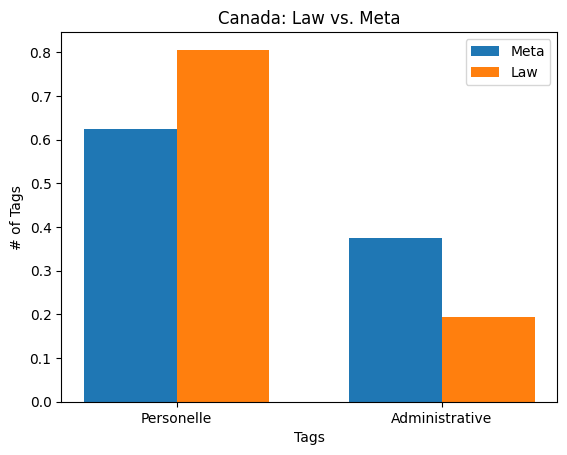

In [65]:
import matplotlib.pyplot as plt
import numpy as np

keys = list(meta_tags_dict.keys())
values1 = [v/len(meta_tags) for v in list(meta_tags_dict.values())]
values2 = [v/len(law_tags) for v in list(law_tags_dict.values())]

bar_width = 0.35
index = np.arange(len(keys))

plt.bar(index - bar_width / 2, values1, width=bar_width, label='Meta')
plt.bar(index + bar_width / 2, values2, width=bar_width, label='Law')

plt.xlabel('Tags')
plt.ylabel('# of Tags')
plt.title('Canada: Law vs. Meta')
plt.xticks(index, keys)
plt.legend()
plt.show()

In [ ]:
# child tags for next time
# Add X and TikTok
# Automatic tagging for laws?

# She'll make (methods memo):
    # Another set of parent/child codes
    # Specific TOS language refering to laws

In [ ]:
# Streamlit app as a catalog of the laws
# Connect to google sheet

# two weeks: description of zero shot

In [20]:
import pickle

with open('./zs_kid_canada_example.p', 'rb') as f:
    data = pickle.load(f)

In [22]:
data = dict(data)
data['meta']

[{'sequence': ' Politique de confidentialité Découvrir la politique Qu’est-ce que la Politique de confidentialité et que couvre-t-elle ?',
  'labels': ['Individuelle',
   "Droit à l'information",
   "Droit d'être informé",
   'Sauvegarde',
   'protection',
   'plainte',
   'Securité',
   'Dignité',
   'Liberté',
   'Sûreté',
   'droits fondamentaux'],
  'scores': [0.23328980803489685,
   0.1748567372560501,
   0.13216552138328552,
   0.12952320277690887,
   0.08540762215852737,
   0.08437526226043701,
   0.062494371086359024,
   0.0568617545068264,
   0.02365817315876484,
   0.011279137805104256,
   0.0060884542763233185]},
 {'sequence': 'Quelles informations recueillons-nous ?',
  'labels': ['entité',
   'publique',
   'surveillance',
   'Indenmité',
   'Institution',
   'Établissement',
   'obligation',
   'organisation',
   'Sauvegarde',
   {'Exception': ['Sécurité',
     'Santé',
     'Pornographie',
     'Sexuelle',
     'Raciste',
     'Racisme',
     'scientifique']},
   'Ent

In [ ]:
# Streamlit app as a catalog of the laws
# Connect to google sheet
# Add "no code" tag

# Comparing qualative with zero shot: methods paper about zero shot coding
# test LLM zero shot

# now: description of zero shot
# LLMs for legal compliance in terms of services